In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

# GM0 Performance Evaluation

**IMPORTANT**: This notebook should be used as a base for the evaluation of different models. 

- Please **make a copy of this notebook** whenever you want to evaluate a model. Load the desired model by changing the following `model_path_str` variable. 
- This notebook is currently not saving any generated plot. Please make sure to not overwrite the outputs, or to save the plots whenever needed. 
- This notebook saves the generated data. Please refer to the Evaluation section of this notebook. 

Available models on the SDSC shared folder: 

In [ ]:
!ls /store/sdsc/sd28/models/GM0/diffusion/

In [1]:
models_folder = "../outputs/"

One can either choose a specific checkpoint of a model or the most recent checkpoint of that model (default):

In [2]:
# Pick the last checkpoint of the model
#model_path_str = models_folder + "ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average-scale:2-log-log_offset:1.0e-07-standardize-scalar:True"

# Or pick a specific checkpoint
model_path_str = models_folder + "ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average-scale:2-log-log_offset:1.0e-07-normalize-scalar:True/name=0_epoch=186-val_loss=0.14.ckpt"

Import the needed libraries, modules and needed variables

In [3]:
import matplotlib.pyplot as plt
import matplotlib as mpl

mpl.rcParams['figure.dpi'] = 100
mpl.rcParams['font.size'] = 13


import numpy as np
import torch
import os

from pathlib import Path
from tqdne.utils import *
from tqdne.conf import Config
from tqdne.metric import *

from tqdne.dataset import RepresentationDataset 
from torch.utils.data import DataLoader, ConcatDataset
from tqdne.plot import BinPlot


/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  torch.utils._pytree._register_pytree_node(
/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/diffusers/utils/outputs.py:63: FutureWarning: `torch.utils._pytree._register_pytree_node` is deprecated. Please use `torch.utils._pytree.register_pytree_node` instead.
  torch.utils._pytree._register_pytree_node(


In [4]:
if torch.cuda.is_available():
    device = torch.device('cuda')
    torch.cuda.empty_cache()
else: 
    device = torch.device('cpu')

torch.cuda.is_available(), device

(True, device(type='cuda'))

In [5]:
config = Config()

# Select the signal length
signal_length = config.original_signal_length 

# Set the sampling frequency
fs = config.original_fs

# Set the number of channels of the original waveforms  
n_channels = config.num_channels

# Set the conditioning parameters range
cond_params_range = config.conditional_params_range

Restore the sampling rate and signal length that were used during training

In [6]:
if "downsampling" in model_path_str:
    downsampling = int(model_path_str.split("downsampling:")[1].split("_")[0])
    signal_length = signal_length // downsampling
    fs = fs // downsampling
    config.signal_length = signal_length
    config.fs = fs
    print(f"Updated signal length: {config.signal_length} and fs: {config.fs}")
else:
    downsampling = 1    

Updated signal length: 2750 and fs: 50


Load the model

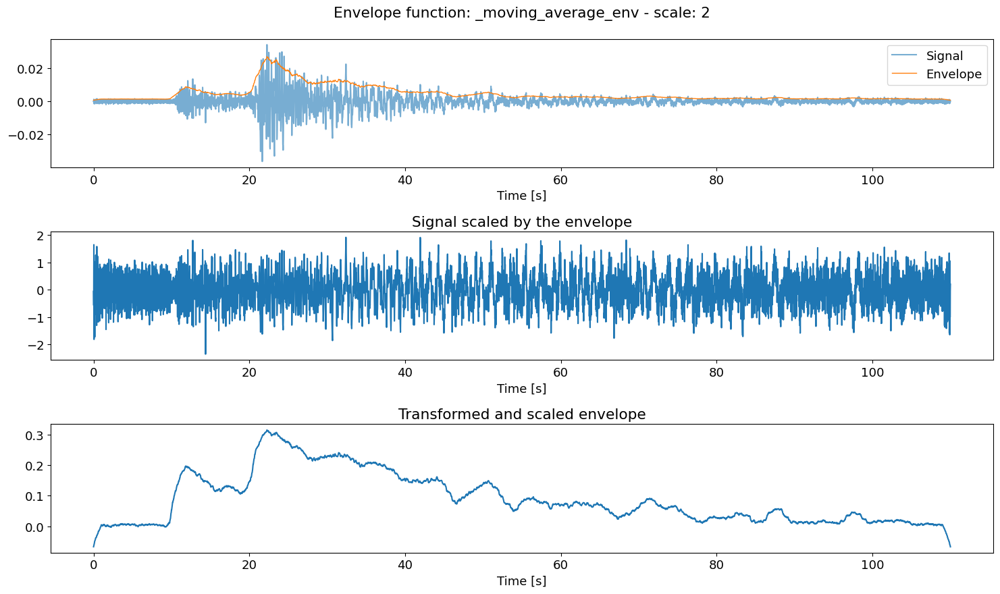

Model: LightningDiffusion
Number of learnable parameters: 9720070
Model size: 117.21 MB
UNet scheme: 
 base num. channels: 32 
 channel multipliers (down/up blocks): (1, 2, 4, 8) 
 num. ResBlocks per down/up block: 2 
 use Attention: True 
 conv. kernel size: 5 
Diffusion prediction type: sample
Learning rate schedule: 
 start: 0.0003 
 scheduler: cosine 
 warmup steps: 400
Batch size: 128
Downsampling factor: 2. The model was trained on signals with length 2750, as the sampling rate used was 50 instead of 100
Data representation shape: (1, 6, 1375) - (batch_size, channels, signal_length)
Data representation name: SignalWithEnvelope
Checkpoint: ../outputs/ddim-pred:sample-1D-downsampling:2_SignalWithEnvelope-moving_average-scale:2-log-log_offset:1.0e-07-normalize-scalar:True/name=0_epoch=186-val_loss=0.14.ckpt - Last modified: 2024-07-12 13:27


In [10]:
model, model_data_repr, ckpt = load_model(Path(model_path_str), signal_length=signal_length, device=device)

In [11]:
from tqdne.representations import SignalWithEnvelope
model_data_repr = SignalWithEnvelope(env_function="moving_average", env_function_params={"scale":2}, env_transform="log", env_transform_params={"log_offset": 1e-1}, scaling={"type": "normalize", "scalar": True})

Let's generate a batch of data

In [12]:
# Select the batch size.
batch_size = model.hparams.optimizer_params.batch_size

# One can also choose the batch size
# batch_size = 32

batch_size = batch_size*3
batch_size

384

In [13]:
# Insert values for the conditional input parameters.
# Please read generate_cond_inputs documentation (in utils.py) to understand the structure of cond_input_params dictionary
cond_input_params = {
    "hypocentral_distance": [10, 50, 100, 150],
    "is_shallow_crustal": [0],
    "magnitude": [5.5, 4, 7, 8.8],
    "vs30": None,
}

data_raw = generate_data(model, model_data_representation=model_data_repr, raw_output=True, num_samples=batch_size, cond_input_params=cond_input_params, device=device.type)
data_raw['waveforms'].shape, data_raw['cond'].shape

Batch 1/3


100%|██████████| 100/100 [00:34<00:00,  2.89it/s]


Batch 2/3


100%|██████████| 100/100 [00:23<00:00,  4.20it/s]


Batch 3/3


100%|██████████| 100/100 [00:23<00:00,  4.20it/s]


((384, 6, 2750), (384, 4))

Timing test

In [14]:
import time

start = time.time()
generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=128, cond_input_params=cond_input_params, device=device.type, batch_size=128)['waveforms'].shape
print(time.time() - start)

Batch 1/1


100%|██████████| 100/100 [00:23<00:00,  4.20it/s]


24.21391725540161


In [15]:
data_raw_wf = data_raw['waveforms']
data_raw_wf.shape

(384, 6, 2750)

In [16]:
data_wf = model_data_repr.invert_representation(data_raw_wf)
data_wf.shape

(384, 3, 2750)

## Single Sample Visualization

Let's investigate model's raw output 

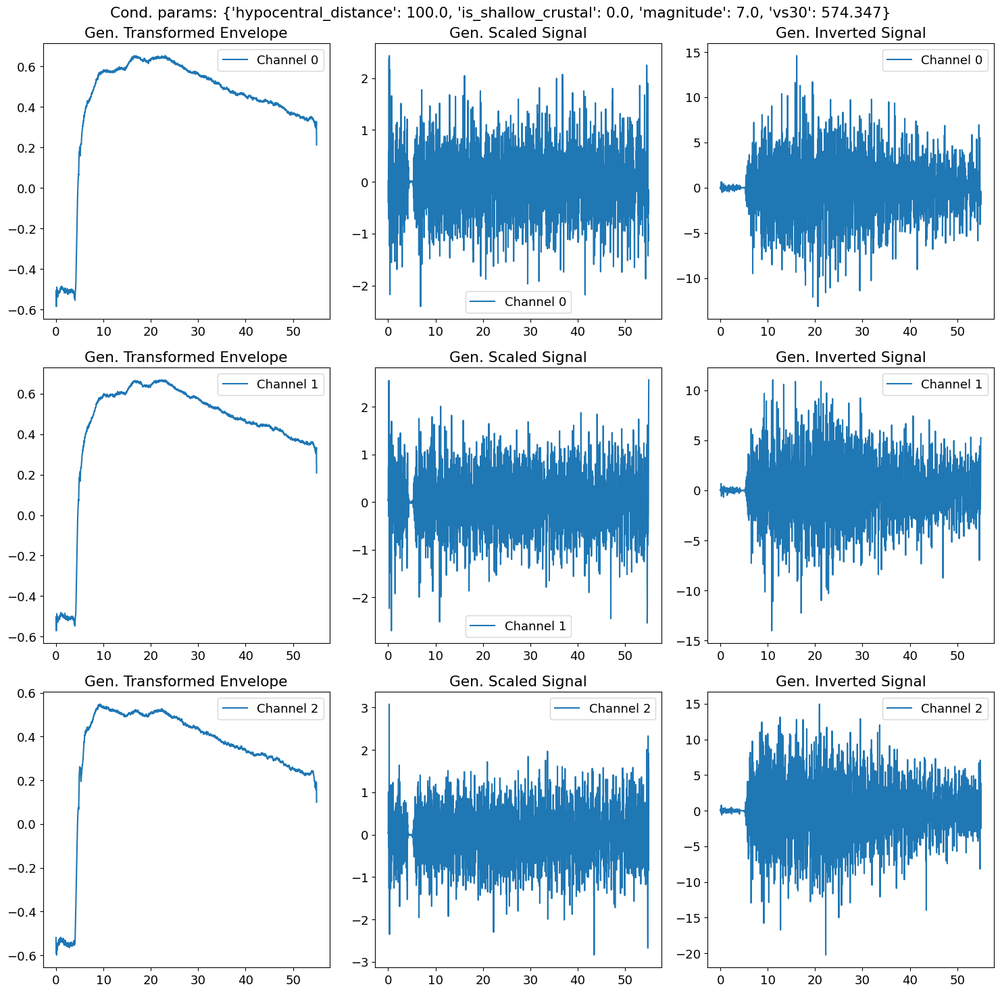

In [17]:
sample_index = 0
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

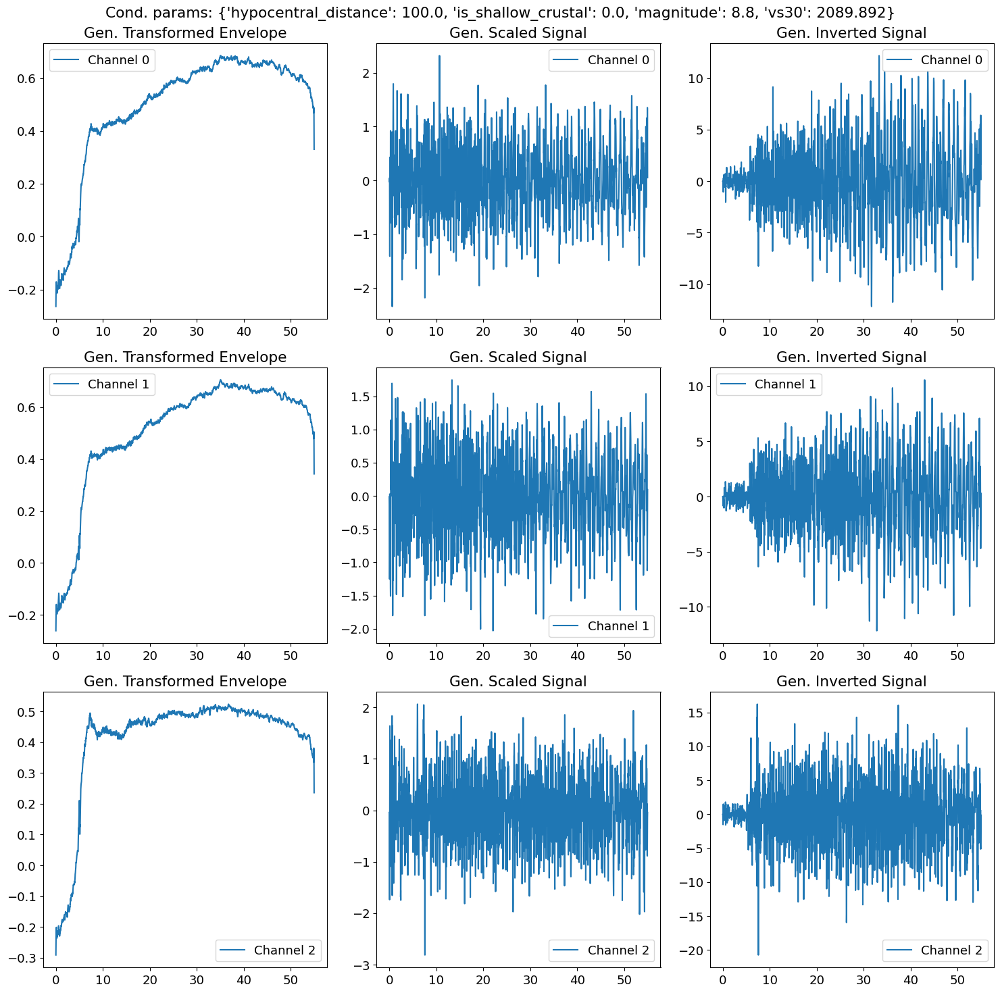

In [18]:
sample_index = 3
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

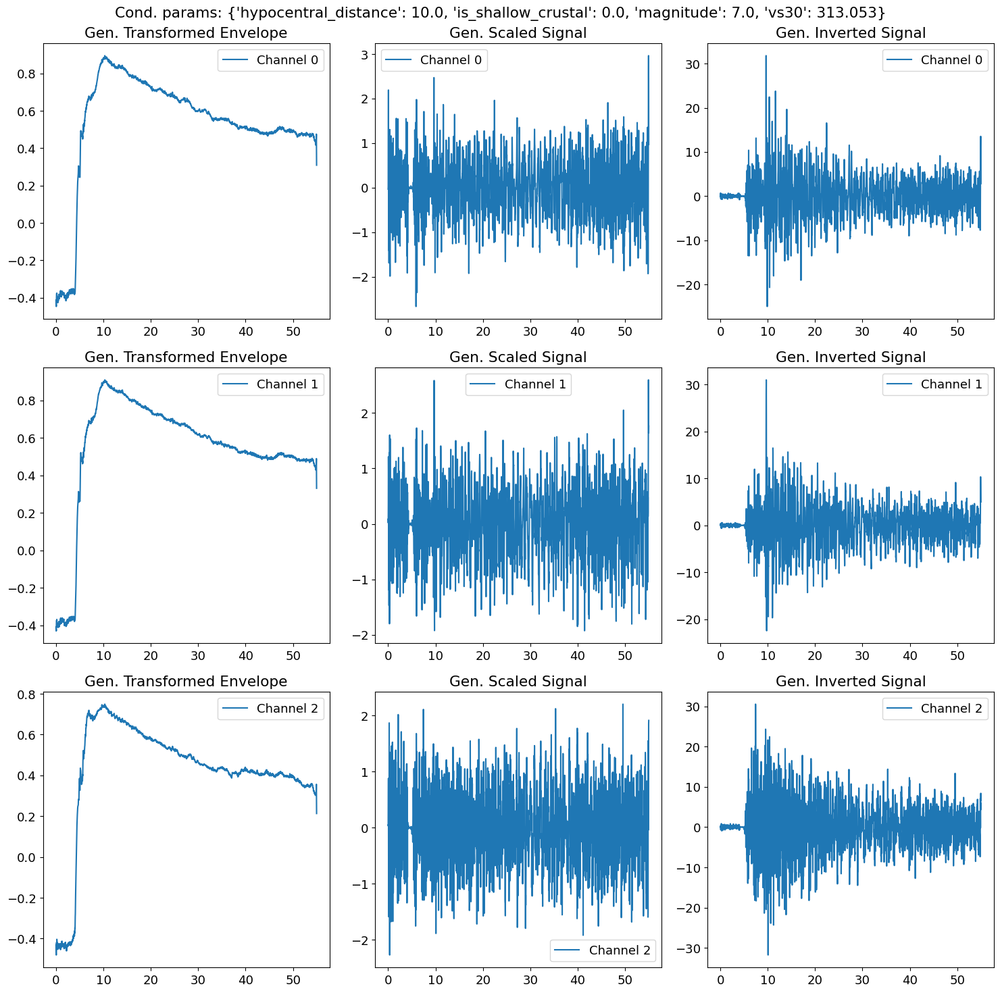

In [19]:
sample_index = -1
plot_raw_waveform(data_raw_wf[sample_index], data_raw['cond'][sample_index], model_data_repr, data_wf[sample_index])

Batch 1/1


100%|██████████| 100/100 [00:01<00:00, 50.30it/s]


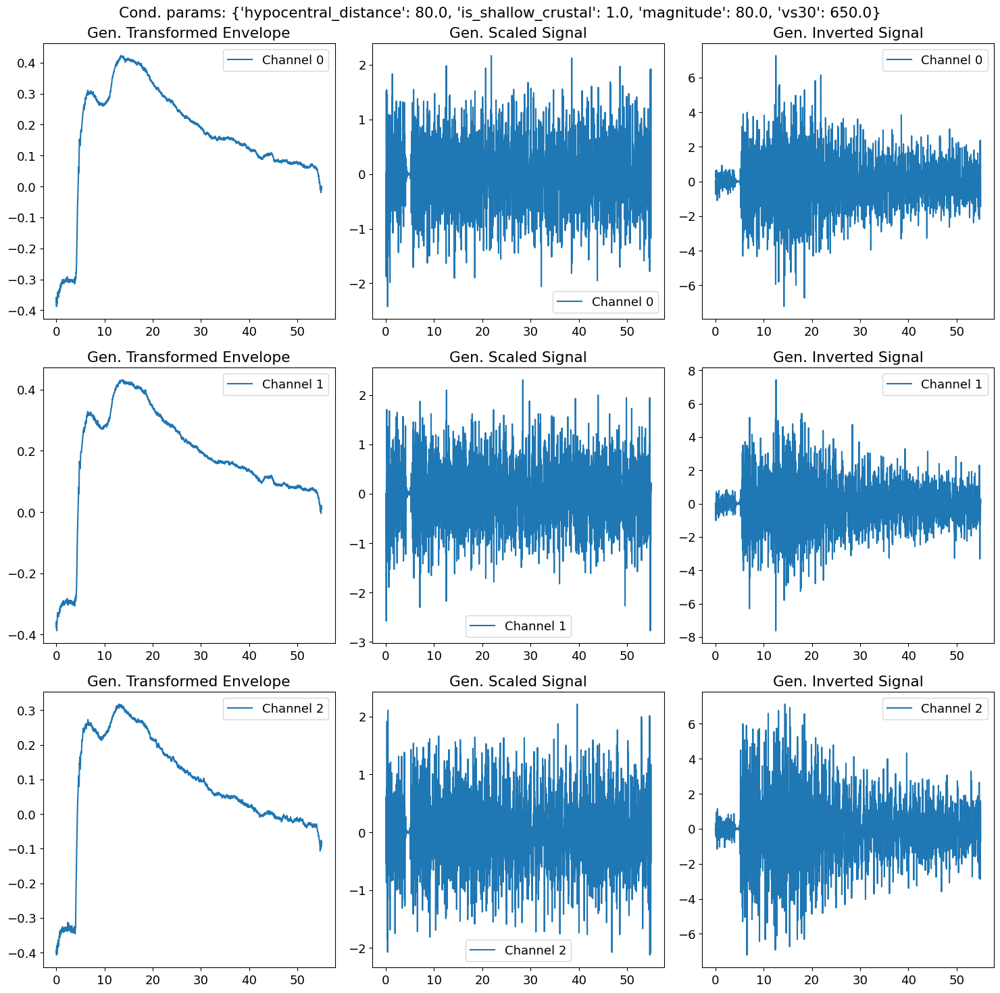

In [20]:
magnitude = 6.5
distance = 80
is_shallow_crustal = 1
vs30 = 650
cond_input = np.array([distance, is_shallow_crustal, distance, vs30], np.float32).reshape(1, -1)
plot_raw_waveform(
    generate_data(model, model_data_repr, raw_output=True, cond_input=cond_input, device=device.type)['waveforms'][0],
    cond_input, 
    model_data_repr 
)

In [21]:
# TODO: works only for 1D signals, need to generalize to 2D signals. However, is only useful for 1D signals.
# max_peak_index = np.argmax(np.max(np.abs(data_raw_wf), axis=(1, 2)))
# plot_raw_waveform(data_raw_wf[max_peak_index], n_channels, data_wf[max_peak_index])

Let's now see the generated waveforms, along with their Power Spectral Density and Log Envelope. 

In [22]:
data = {"waveforms": data_wf, "cond": data_raw['cond']}

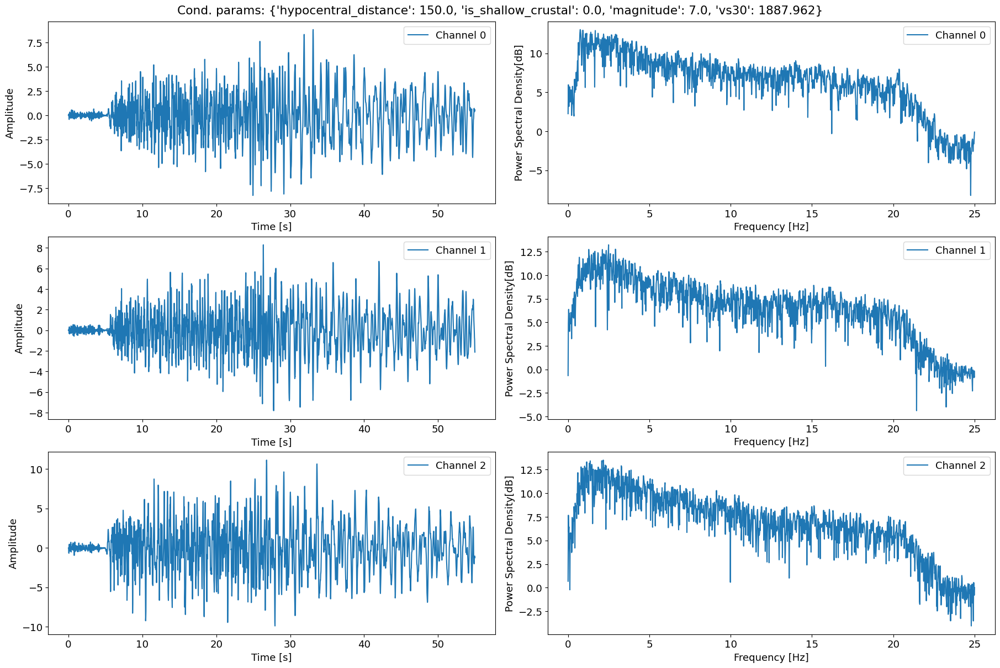

In [23]:
plot_waveform_and_psd(get_samples(data, num_samples=1))

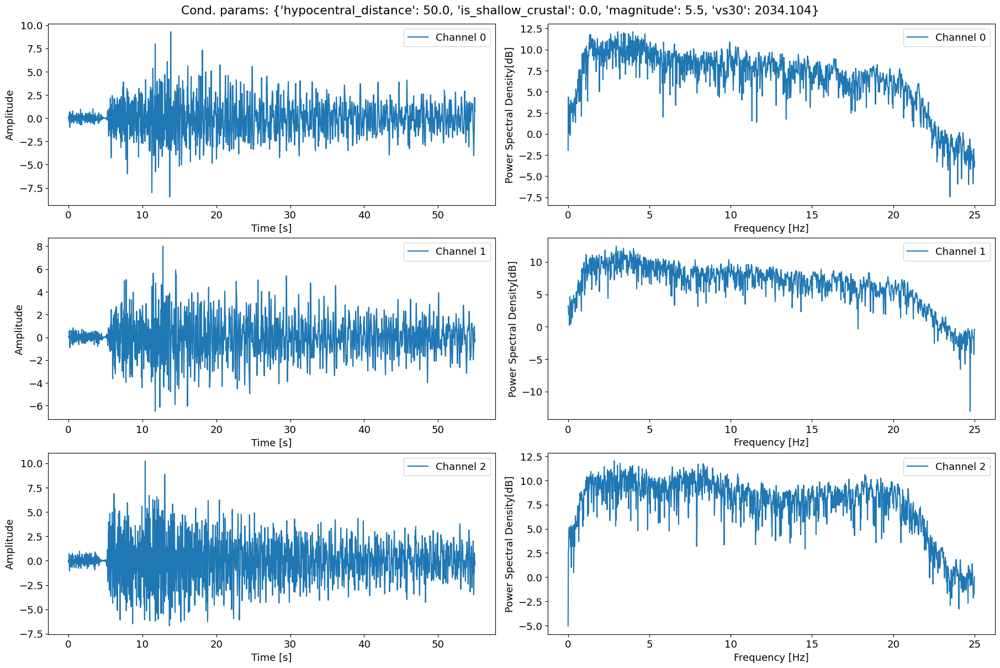

In [24]:
plot_waveform_and_psd(get_samples(data, indexes=[2]))

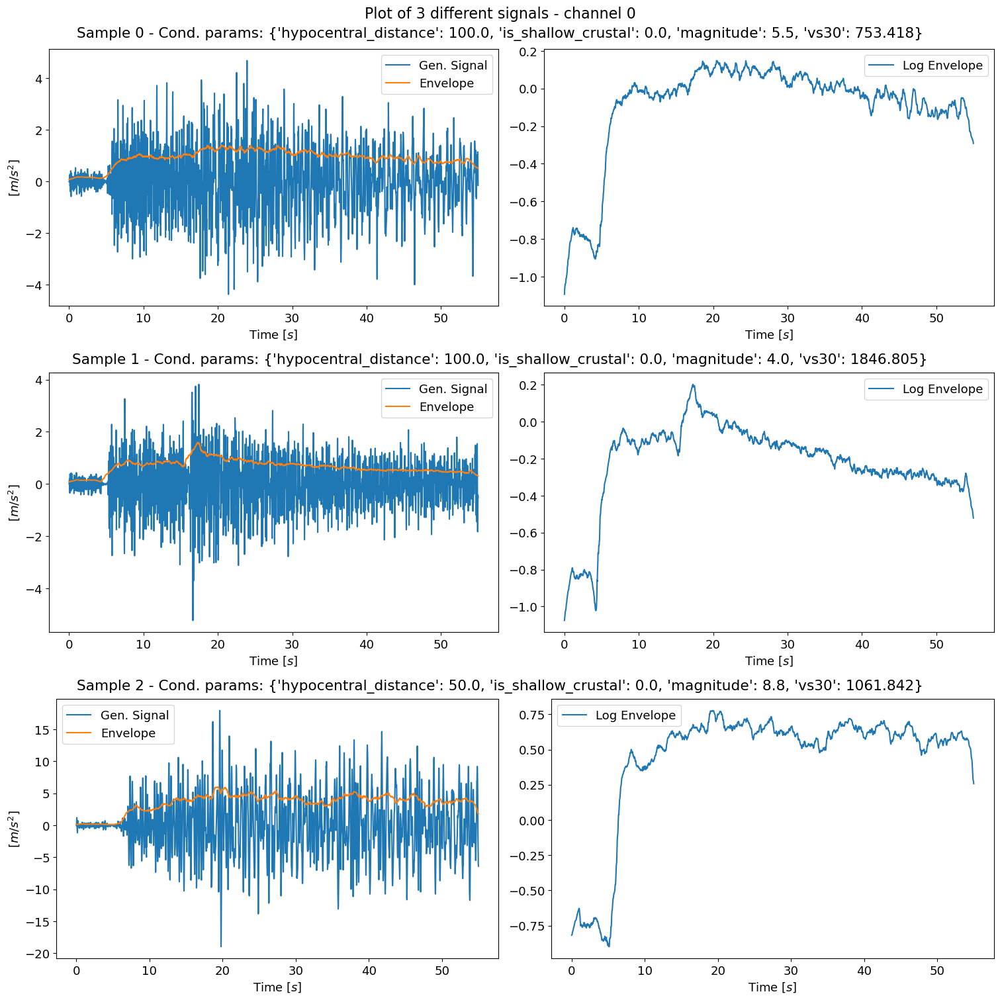

In [25]:
plot_waveforms(get_samples(data, num_samples=3), channel_index=0, plot_log_envelope=True)

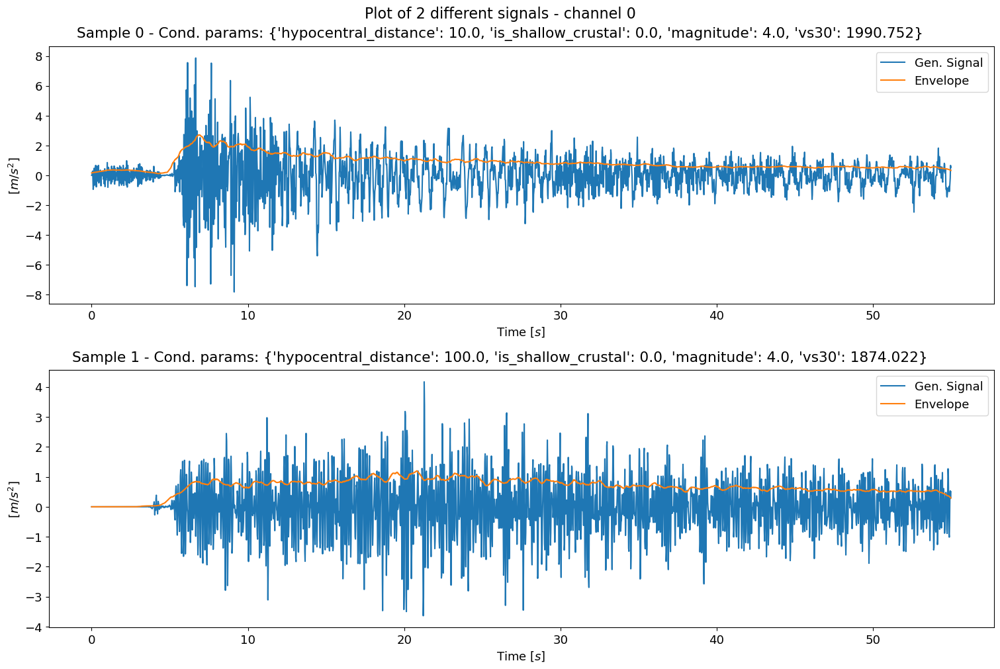

In [26]:
plot_waveforms(get_samples(data, num_samples=2), channel_index=0, plot_log_envelope=False)

## Batch Statistics

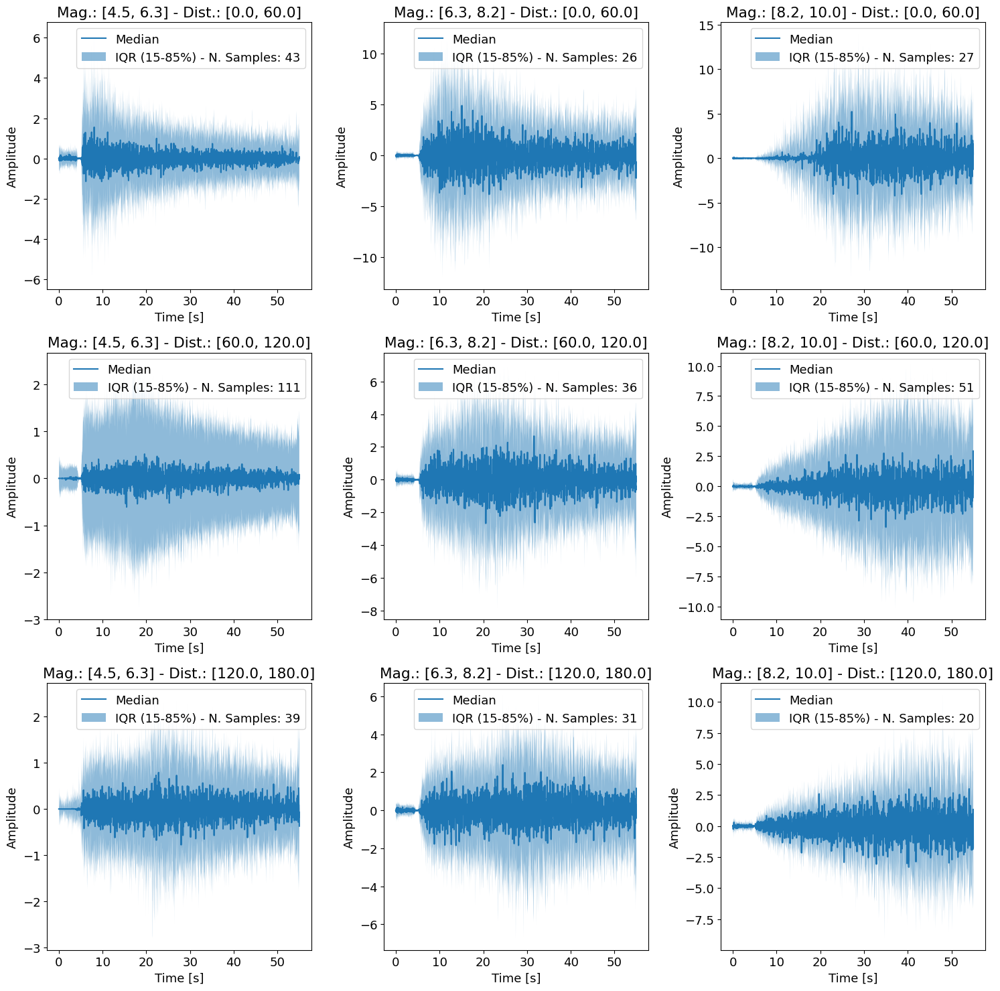

In [27]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='waveform')

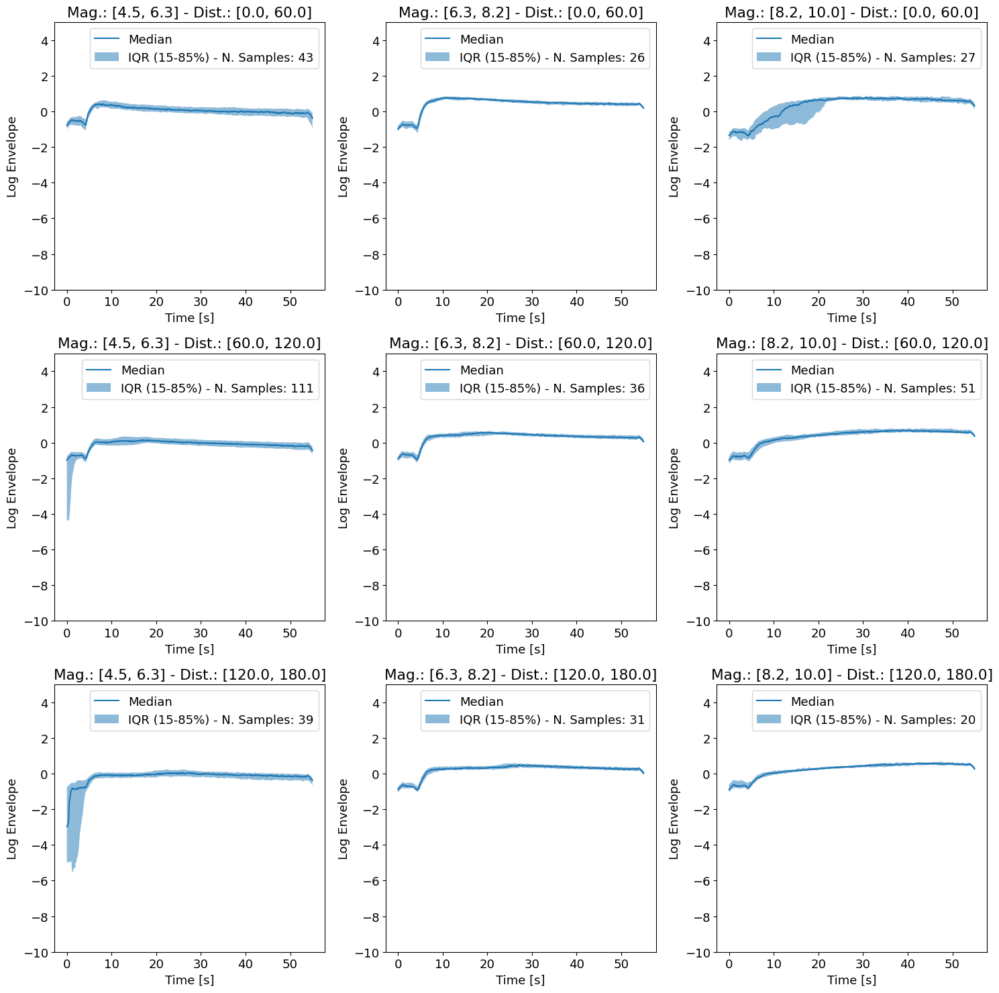

In [28]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='log_envelope')

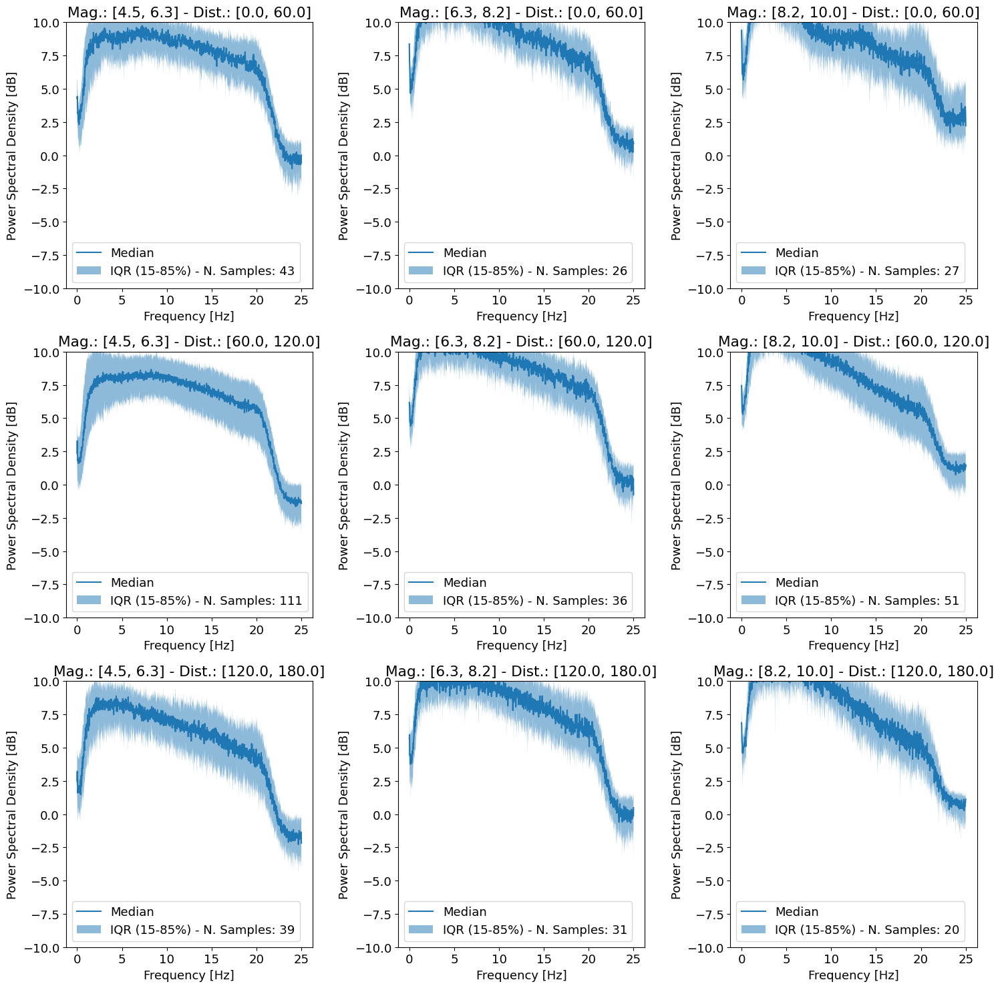

In [29]:
plot_by_bins(data, num_magnitude_bins=3, num_distance_bins=3, plot_type='power_spectral_density')

In [57]:
del data
del data_raw

## Evaluation

In [30]:
from tqdne.representations import Signal

train_dataset_path = config.datasetdir / config.data_train
test_dataset_path = config.datasetdir / config.data_test

test_dataset = RepresentationDataset(test_dataset_path, Signal(), pad=config.signal_length*downsampling, downsample=downsampling)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)
train_dataset = RepresentationDataset(train_dataset_path, Signal(), pad=config.signal_length*downsampling, downsample=downsampling)
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=False)

Batch 1/1


100%|██████████| 100/100 [00:04<00:00, 22.12it/s]


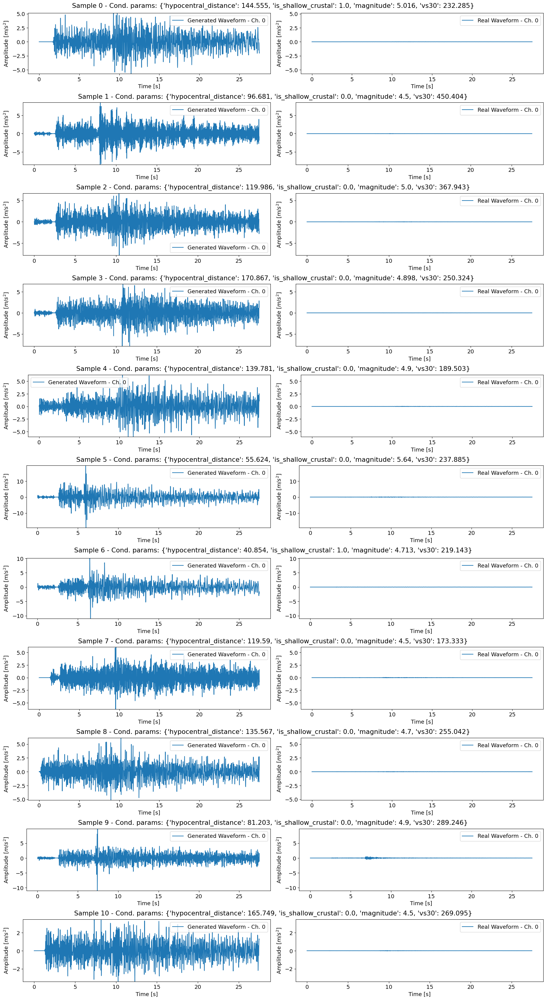

In [31]:
random_indexes = np.random.choice(len(test_dataset), 11, replace=False)
plot_generated_vs_real_waveforms(
    generated_data = generate_data(model, model_data_representation=model_data_repr, raw_output=False, cond_input=test_dataset[random_indexes]['cond'], device=device.type),
    real_data = test_dataset[random_indexes],
    channel_index = 0
)

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 39.09it/s]


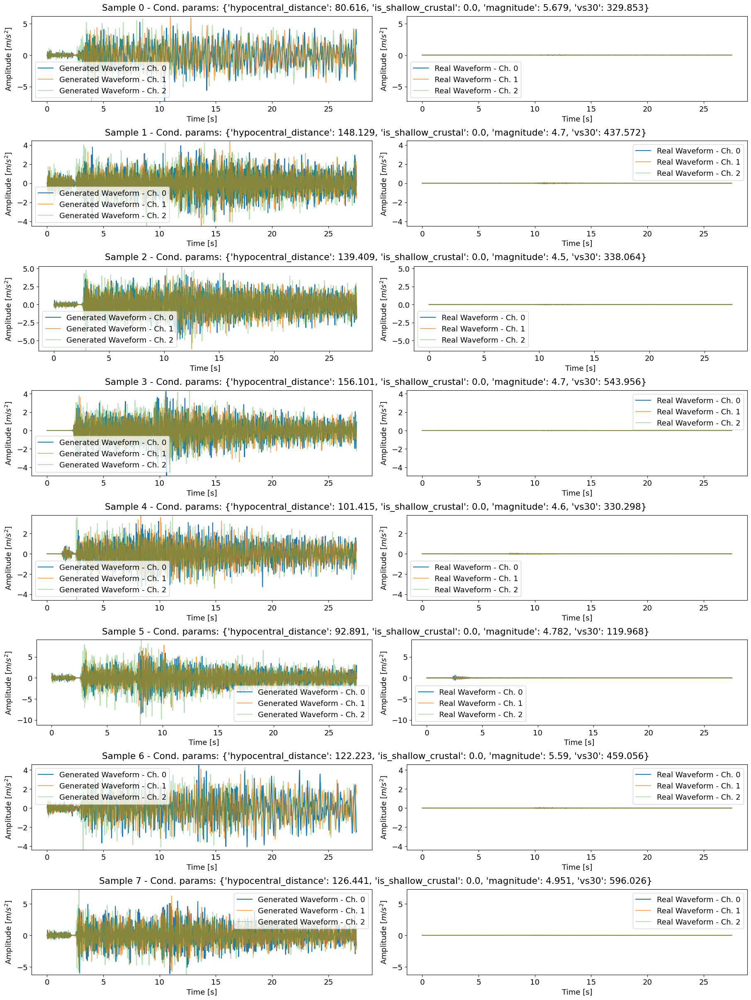

In [32]:
random_indexes = np.random.choice(len(test_dataset), 8, replace=False)
plot_generated_vs_real_waveforms(
    generated_data = generate_data(model, model_data_representation=model_data_repr, raw_output=False, cond_input=test_dataset[random_indexes]['cond'], device=device.type),
    real_data = test_dataset[random_indexes],
    channel_index = -1
)

Let's generate couple of samples with the same conditioning parameters to check the expressiveness of the model and check if it lies within the true data distribution. 

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 40.10it/s]


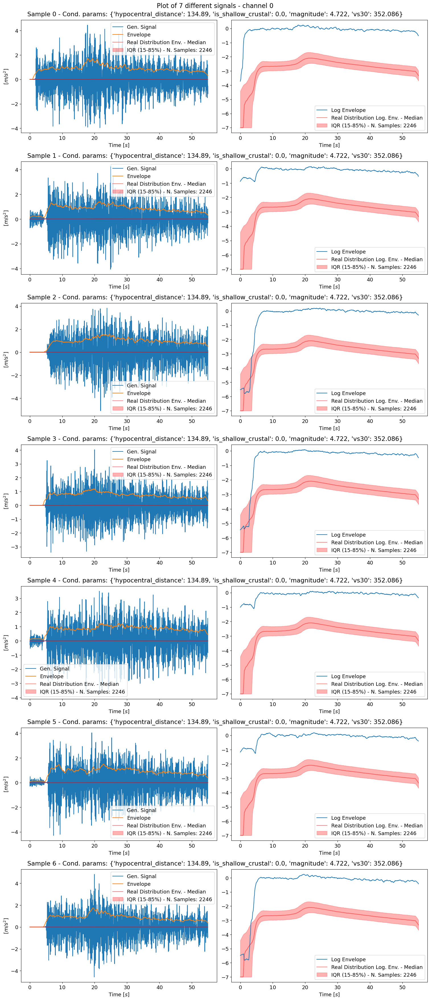

In [33]:
mag_bin = (4, 5)
dist_bin = (120, 150)
data_test_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_test_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_test_single_bin['waveform'])

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 40.83it/s]


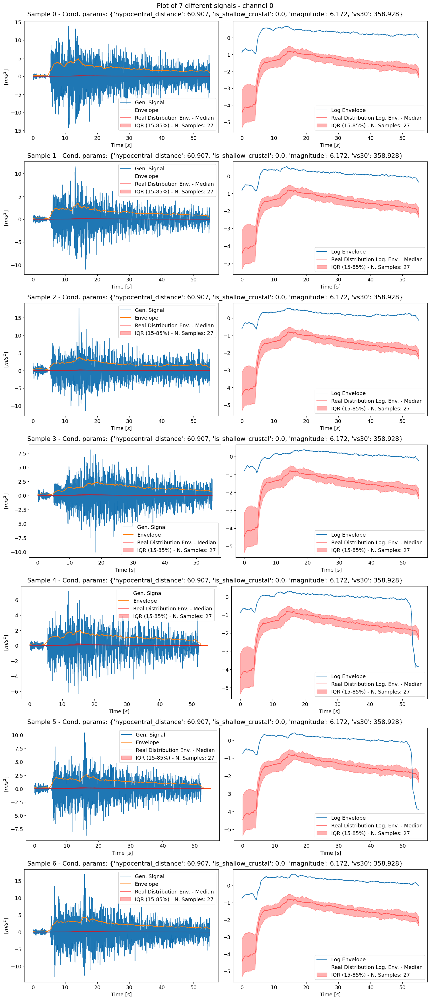

In [34]:
mag_bin = (6, 6.5)
dist_bin = (50, 70)
data_test_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_test_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_test_single_bin['waveform'])

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 40.57it/s]


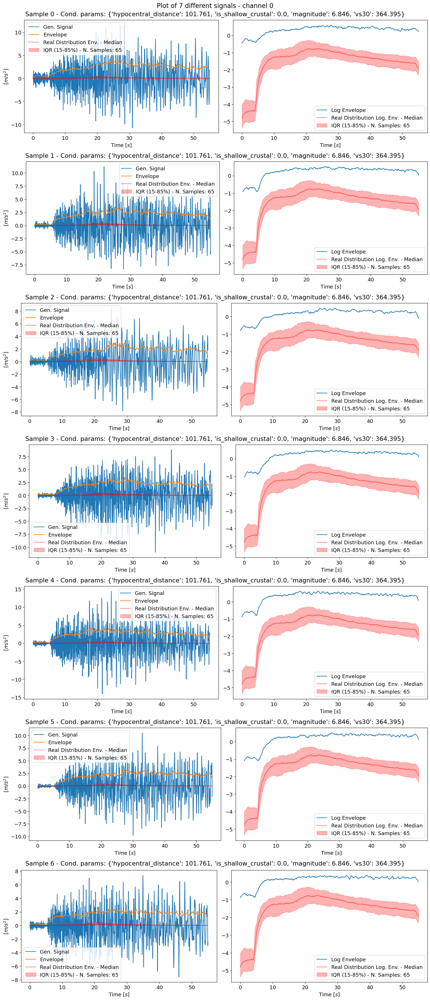

In [35]:
mag_bin = (6.5, 8.)
dist_bin = (80, 120)
data_real_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_real_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=7, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_real_single_bin['waveform'])

Batch 1/1


100%|██████████| 100/100 [00:02<00:00, 46.42it/s]


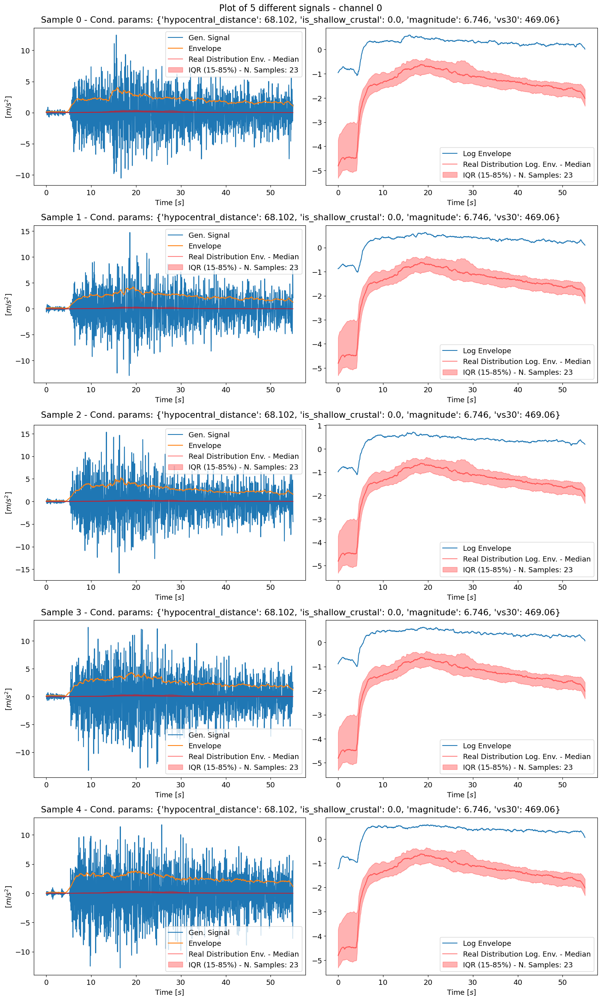

In [36]:
mag_bin = (6.5, 7.5)
dist_bin = (50, 80)
data_real_single_bin = test_dataset.get_data_by_bins(mag_bin, dist_bin, is_shallow_crustal=0)
cond_params_mean = data_real_single_bin['cond'].mean(axis=0).reshape(1,-1)
data_pred_single_bin = generate_data(model, model_data_representation=model_data_repr, raw_output=False, num_samples=5, cond_input=cond_params_mean, device=device.type)

plot_waveforms(data_pred_single_bin, test_waveforms=data_real_single_bin['waveform'])

Let's now compare the statistics of the generated data wrt the real data.

In [37]:
real_data = {
    "waveforms": np.concatenate([test_dataset[:]['waveform'], train_dataset[:]['waveform']], axis=0),
    "cond": np.concatenate([test_dataset[:]['cond'], train_dataset[:]['cond']], axis=0)
}
real_data['waveforms'].shape, real_data['cond'].shape

((197370, 3, 2750), (197370, 4))

Now let's generate more samples to perform an analysis by dividing the data in bins (magnitude and distance). 

Let's save the generated data future use.

The data will be saved as a `dict` with keys `waveforms` and `cond` in the same place of the checkpoint of the selected model, with the same name of `ckpt`, except for the extension of the file (saved as a HDF5 `.hdf5` file).
The optimal approach for downloading the generated dataset to a local storage location is to replace the string `hdf5_filename` with the desired filename, thus enabling the file to be stored in the current directory. This file may then be downloaded via the integrated visual interface of VSCode or JupyterLab. 


In [38]:
# Save the generated waveforms along with the conditioning parameters
hdf5_filename = f"{str(ckpt).replace('.ckpt', '_high-eps.hdf5')}"
hdf5_filepath = Path(hdf5_filename)

**Disclaimer** 

The next cell takes long time as it generates ~200k samples. Therefore it is executed only if `generate_data` define right below is set to `True`.  

In [41]:
generate_data_flag = True

If the `hdf5_filename` file already contains the generated samples (as it should be), then it is possible to skip the next 2 cells and upload the samples from the file.

In [45]:
# Generate waveforms with the same conditioning parameters of the real data
if generate_data_flag:
    generated_raw_data = generate_data(
        model, 
        model_data_repr, 
        raw_output=True, 
        num_samples=real_data['waveforms'].shape[0], 
        cond_input=real_data['cond'], 
        device=device.type, 
        batch_size=batch_size,
        save_path=hdf5_filepath
    )

generated_raw_data['waveforms'].shape, generated_raw_data['cond'].shape

Batch 1/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 2/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 3/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 4/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 5/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 6/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 7/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 8/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 9/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 10/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 11/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 12/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 13/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 14/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 15/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 16/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 17/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 18/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 19/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 20/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 21/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 22/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 23/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 24/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 25/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 26/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 27/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 28/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 29/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 30/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 31/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 32/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 33/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 34/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 35/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 36/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 37/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 38/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 39/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 40/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 41/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 42/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 43/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 44/513


100%|██████████| 100/100 [01:07<00:00,  1.47it/s]


Batch 45/513


  5%|▌         | 5/100 [00:03<01:05,  1.46it/s]


KeyboardInterrupt: 

Let's check the raw outputs by comparing them statistically with real data in the representation domain. 

In [46]:
plot_raw_output_distribution(generated_raw_data["waveforms"], real_data['waveform'], model_data_repr)

NameError: name 'generated_raw_data' is not defined

In [47]:
# Upload all the generated samples stored in the file 
with h5py.File(hdf5_filepath, 'r') as f:
    generated_data = {"waveforms": f['waveforms'][:], "cond": f['cond'][:]}
    if generated_data['waveforms'].shape[1] > n_channels:
        generated_data = model_data_repr.invert_representation(generated_data)

generated_data['waveforms'].shape, generated_data['cond'].shape

((16896, 3, 2750), (16896, 4))

And let's now compare the generated data against the real ones. 

In [48]:
distance_bins = [(0, 40), (40, 60), (60, 80), (80.0, 120.), (120., 150.), (150., 200.)]
magnitude_bins = [(4.5, 5.0), (5., 5.5), (5.5, 6.5), (6.5, 7.5), (7.5, 9.5)]

In [50]:
mpl.rcParams['font.size'] = 13

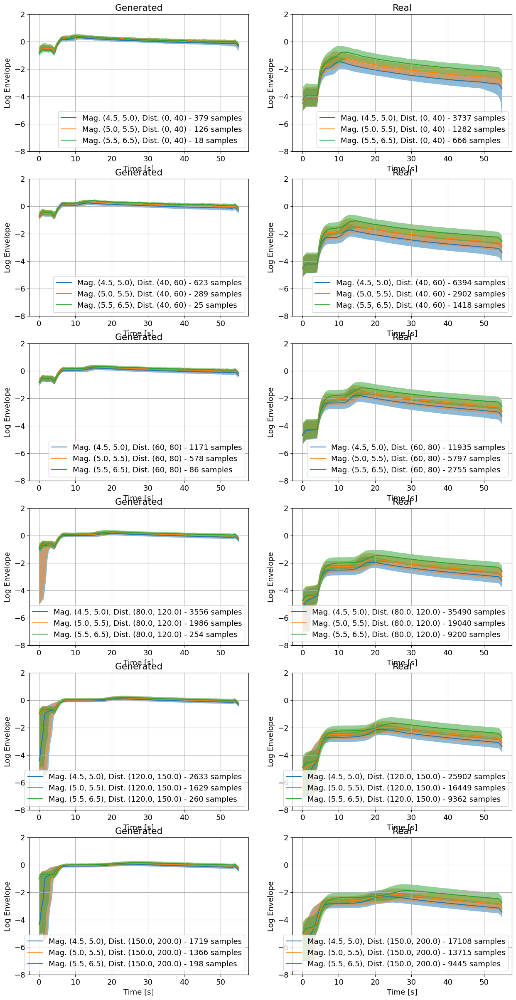

In [51]:
plot_bins(
    plot_type='log_envelope',
    distance_bins=distance_bins,
    magnitude_bins=magnitude_bins,
    channel_index=0,
    test_data=real_data, 
    data=generated_data, 
    model=model,
    model_data_representation = model_data_repr
)

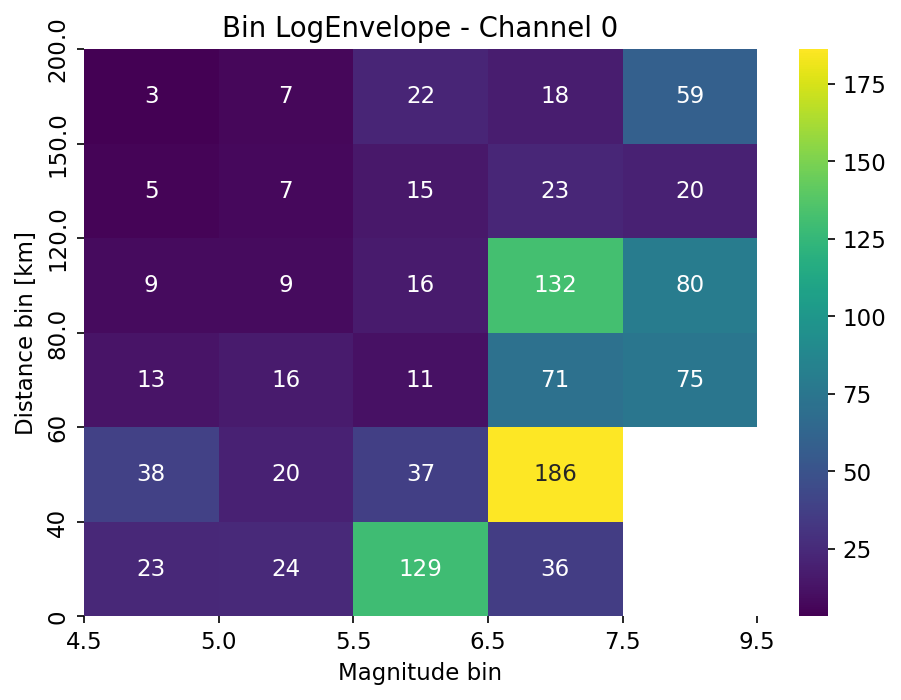

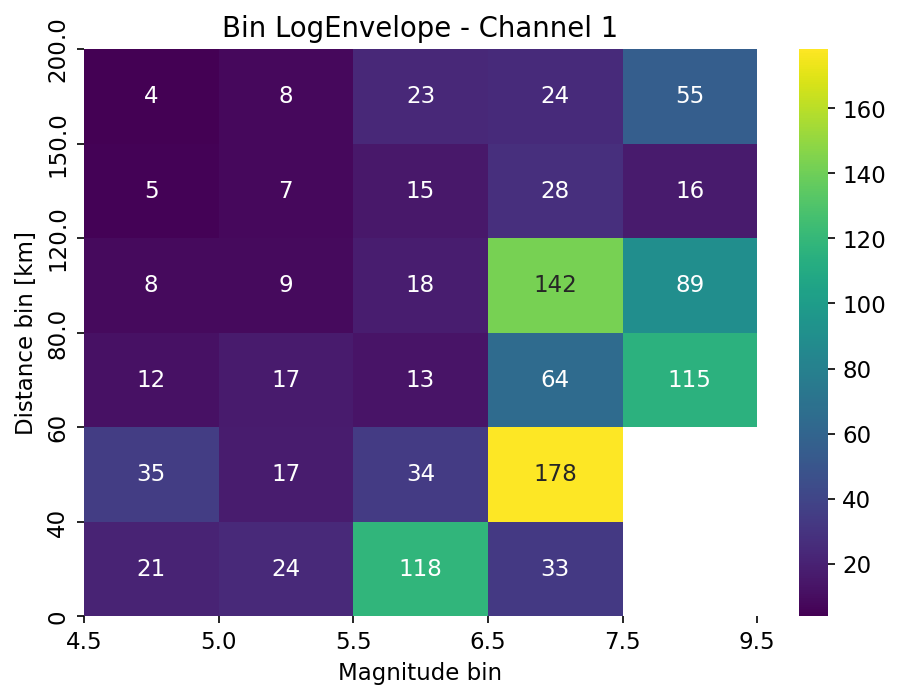

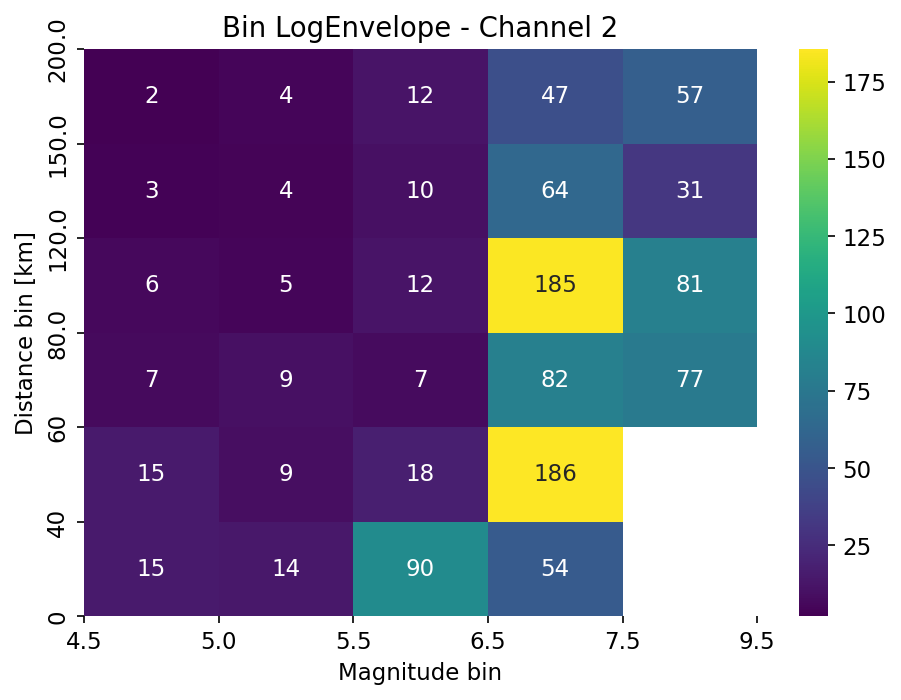

In [19]:
from tqdne.metric import LogEnvelope

for ch in range(n_channels):
    fig = BinPlot(metric=LogEnvelope(channel=ch, invert_representation=False), mag_bins=magnitude_bins, dist_bins=distance_bins, fmt=".0f")(
        preds=generated_data['waveforms'],
        target=real_data['waveforms'],
        cond=real_data['cond']
    )
    plt.show()
    #fig.savefig(f"../figures/logenv_heatmap_{ch}.pdf")

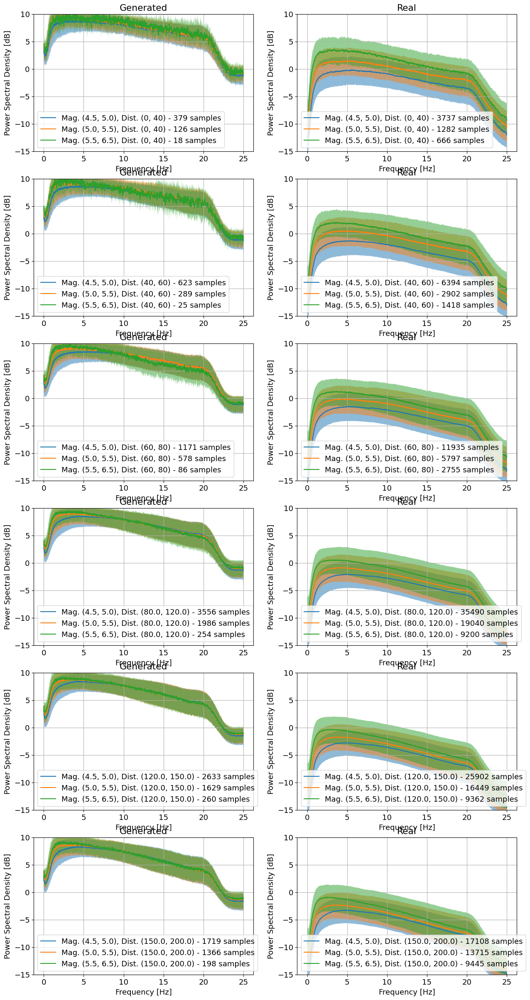

In [52]:
plot_bins(
    plot_type='power_spectral_density',
    distance_bins=distance_bins,
    magnitude_bins=magnitude_bins,
    channel_index=0,
    test_data=real_data, 
    data=generated_data, 
    model=model,
    model_data_representation=model_data_repr
)

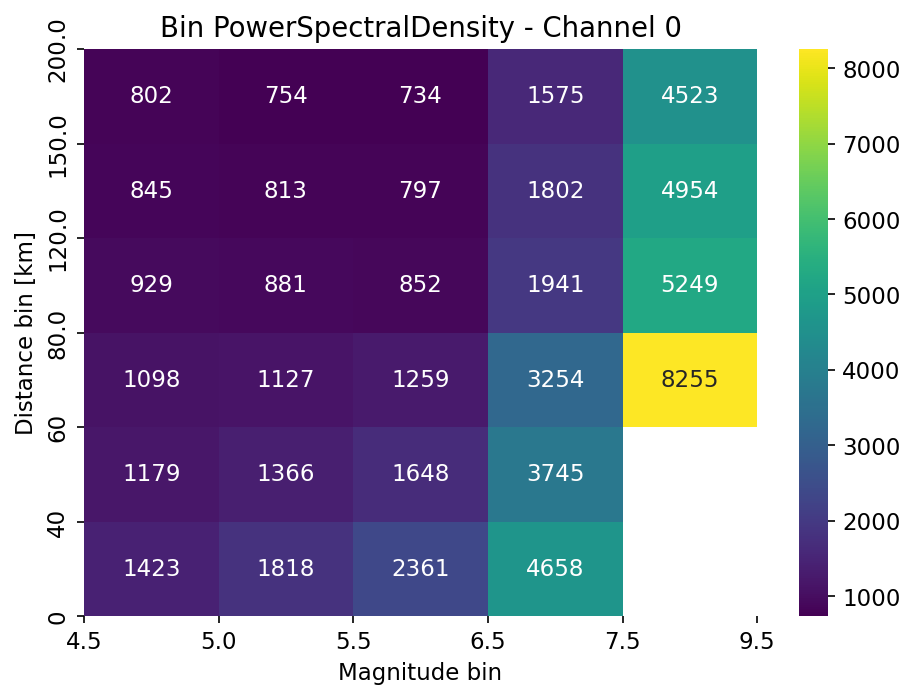

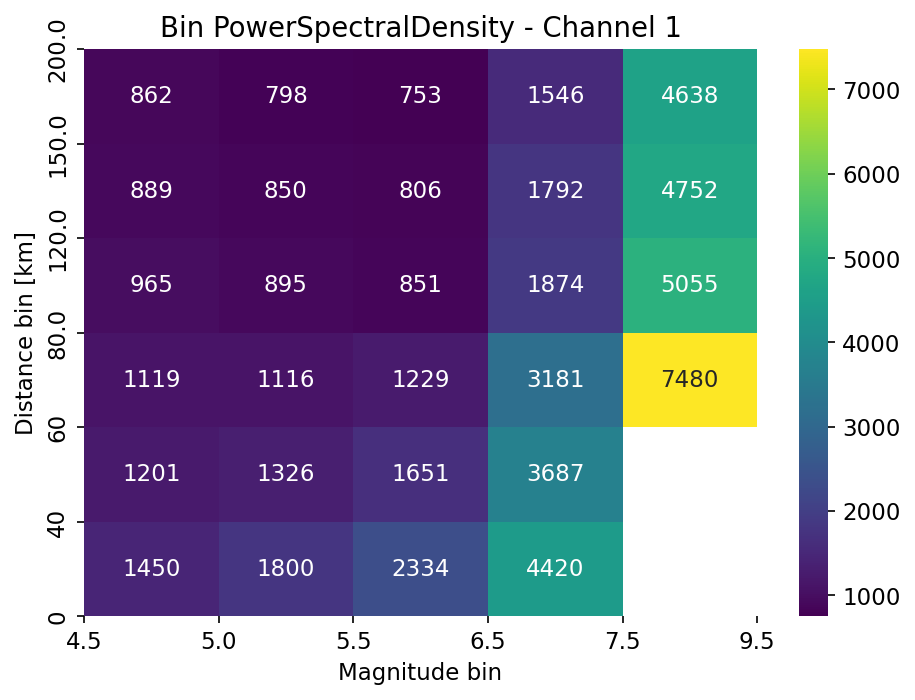

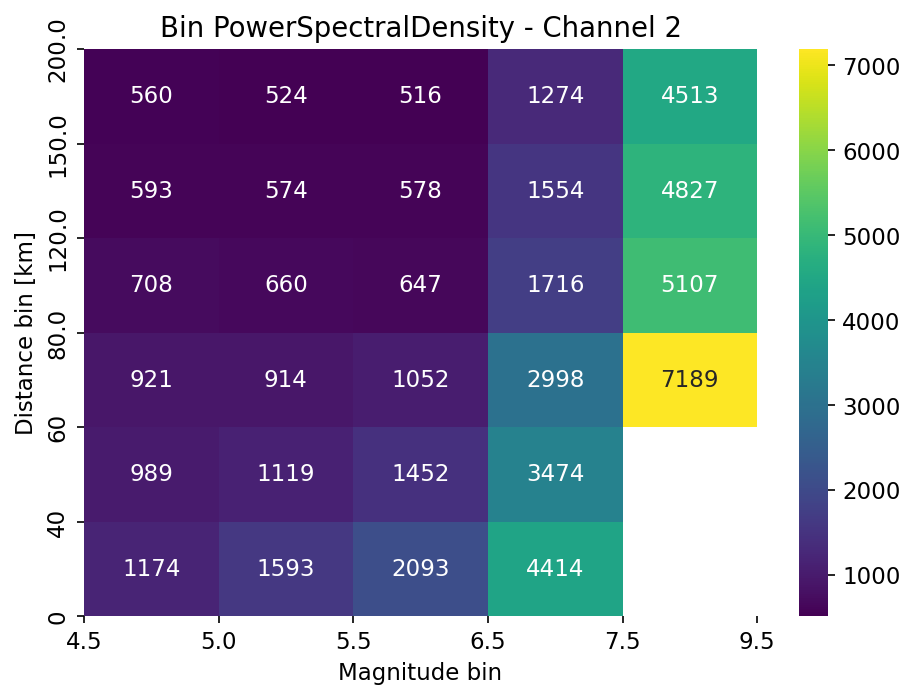

In [22]:
from tqdne.metric import PowerSpectralDensity
for ch in range(n_channels):
    fig = BinPlot(metric=PowerSpectralDensity(fs=fs, channel=ch, invert_representation=False), mag_bins=magnitude_bins, dist_bins=distance_bins, fmt=".0f")(
        preds=generated_data['waveforms'],
        target=real_data['waveforms'],
        cond=real_data['cond']
    )
    plt.show()
    #fig.savefig(f"../figures/psd_heatmap_{ch}.pdf")

In [38]:
# Compare the mean of the generated signals against the real ones, for each channel
print(f"Mean of generated signals channels: {generated_data['waveforms'].mean(axis=(0, -1))}")
print(f"Mean of real signals channels: {real_data['waveforms'].mean(axis=(0, -1))}")

Mean of generated signals channels: [ 1.66898311e-05 -5.71089035e-06  5.79119615e-06]
Mean of real signals channels: [2.2531854e-08 2.6631879e-08 3.7551253e-08]


### Neural Metrics

In [17]:
classifier_path = Path("../outputs/classifier-2D-32Chan-(1, 2, 4, 8)Mult-2ResBlocks-4AttHeads_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=27-val_loss=0.92.ckpt")
classifier, classifier_data_repr, classifier_ckpt = load_model(classifier_path, signal_length=signal_length, device=device)
classifier_ckpt

/users/abosisio/miniforge3/envs/tqdne/lib/python3.11/site-packages/pytorch_lightning/utilities/parsing.py:199: Attribute 'loss' is an instance of `nn.Module` and is already saved during checkpointing. It is recommended to ignore them using `self.save_hyperparameters(ignore=['loss'])`.


PosixPath('../outputs/classifier-2D-32Chan-(1, 2, 4, 8)Mult-2ResBlocks-4AttHeads_LogSpectrogram-stft_ch:128-hop_size:32/name=0_epoch=27-val_loss=0.92.ckpt')

#### Fréchet Embedding Distance (FED)

In [18]:
from tqdne.metric import frechet_distance

##### Train Set vs Test Set

In [22]:
train_embeddings = classifier.get_embeddings(train_dataloader, classifier_data_repr)
test_embeddings = classifier.get_embeddings(test_dataloader, classifier_data_repr)

fid_train_vs_test = frechet_distance(train_embeddings, test_embeddings)
print(f"FID lowerbound (train (N={len(train_dataset)}) vs test (N={len(test_dataset)})): {fid_train_vs_test}")

100%|██████████| 52/52 [01:01<00:00,  1.18s/it]


FID lowerbound (train (N=177633) vs test (N=19737)): 0.004258322713660334


##### Generated vs Test

In [23]:
gen_embeddings = classifier.get_embeddings(generated_data['waveforms'], classifier_data_repr)

fid_test_vs_gen = frechet_distance(test_embeddings, gen_embeddings)
print(f"FID test (N={len(test_dataset)}) vs generated (N={generated_data['waveforms'].shape[0]}): {fid_test_vs_gen}")

100%|██████████| 128/128 [07:35<00:00,  3.56s/it]


FID test (N=19737) vs generated (N=197370): 8.290275293088044


##### Generated vs Real

In [24]:
fid_real_vs_gen = frechet_distance(np.concatenate([train_embeddings, test_embeddings], axis=0), gen_embeddings)
print(f"FID real (N={train_embeddings.shape[0] + test_embeddings.shape[0]}) vs generated (N={gen_embeddings.shape[0]}): {fid_real_vs_gen}")

FID real (N=197370) vs generated (N=197370): 8.226416600227381


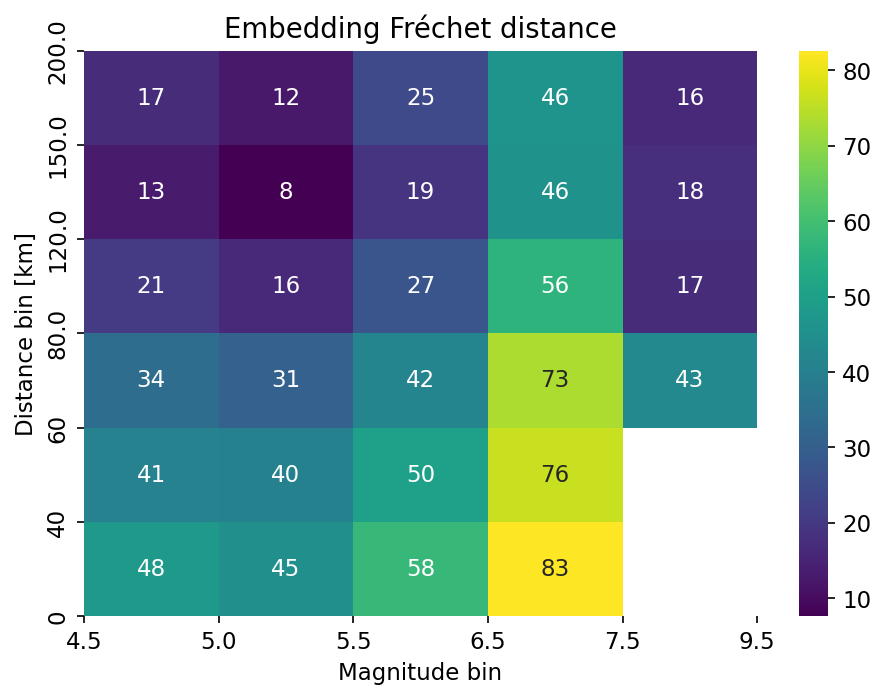

In [25]:
fid_metric = lambda x, y: frechet_distance(x, y)
fig = BinPlot(metric=fid_metric, mag_bins=magnitude_bins, dist_bins=distance_bins, fmt=".0f", title="Embedding Fréchet distance")(
    preds={"waveforms": gen_embeddings, "cond": generated_data['cond']},
    target={"waveforms": np.concatenate([train_embeddings, test_embeddings]), "cond": real_data['cond']}   
)
plt.show()
#fig.savefig("../figures/embedding_full-dataset_heatmap.pdf")

#### Classifier Accuracy

In [26]:
def get_labels(mags, dists):
    mag_bins = [(4.5, 4.8), (4.8, 5), (5, 5.5), (5.5, 6.5), (6.5, 9.1)]
    dist_bins = [(0, 50), (50, 100), (100, 150), (150, 200)]
    # TODO: 
    #mag_bins = classifier.ml_config.bins.mag
    #dis_bins = classifier.ml_config.bins.dist
    bin_mapping = {f"{i}_{j}": idx for idx, (i, j) in enumerate(np.ndindex((len(dist_bins), len(mag_bins))))}
    labels = np.zeros(len(mags), dtype=int)
    sample_idx = 0 
    for mag, dist in zip(mags, dists):
        for i, dist_bin in enumerate(dist_bins):
            for j, mag_bin in enumerate(mag_bins):
                if dist >= dist_bin[0] and dist < dist_bin[1] and mag >= mag_bin[0] and mag < mag_bin[1]:
                    labels[sample_idx] = bin_mapping[f"{i}_{j}"] 
                    sample_idx += 1
    return labels                

def accuracy(logits, labels):
    return (logits.argmax(axis=-1) == labels).mean() * 100

In [28]:
classifier_preds = classifier.get_predictions(gen_embeddings, from_embeddings=True)
real_labels = get_labels(generated_data['cond'][:, 2], generated_data['cond'][:, 0])
print(f"Accuracy - Synthetic Dataset (Full): {round(accuracy(logits=classifier_preds,  labels=real_labels), 3)} %")
train_start_idx = len(test_dataset)
print(f"Accuracy - Synthetic Dataset (Test): {round(accuracy(logits=classifier_preds[:train_start_idx], labels=real_labels[:train_start_idx]), 3)} %")
print(f"Accuracy - Real Dataset (Test): {round(accuracy(classifier.get_predictions(test_dataset[:]['waveform'], classifier_data_repr), real_labels[:train_start_idx]), 3)} %")
print(f"Accuracy - Real Dataset (Train): {round(accuracy(classifier.get_predictions(train_dataset[:]['waveform'], classifier_data_repr), real_labels[train_start_idx:]), 3)} %")

100%|██████████| 128/128 [00:00<00:00, 2334.02it/s]


Accuracy - Synthetic Dataset (Full): 19.641 %
Accuracy - Synthetic Dataset (Test): 19.051 %


100%|██████████| 128/128 [00:37<00:00,  3.42it/s]


Accuracy - Real Dataset (Test): 60.141 %


100%|██████████| 128/128 [05:29<00:00,  2.58s/it]

Accuracy - Real Dataset (Train): 62.129 %


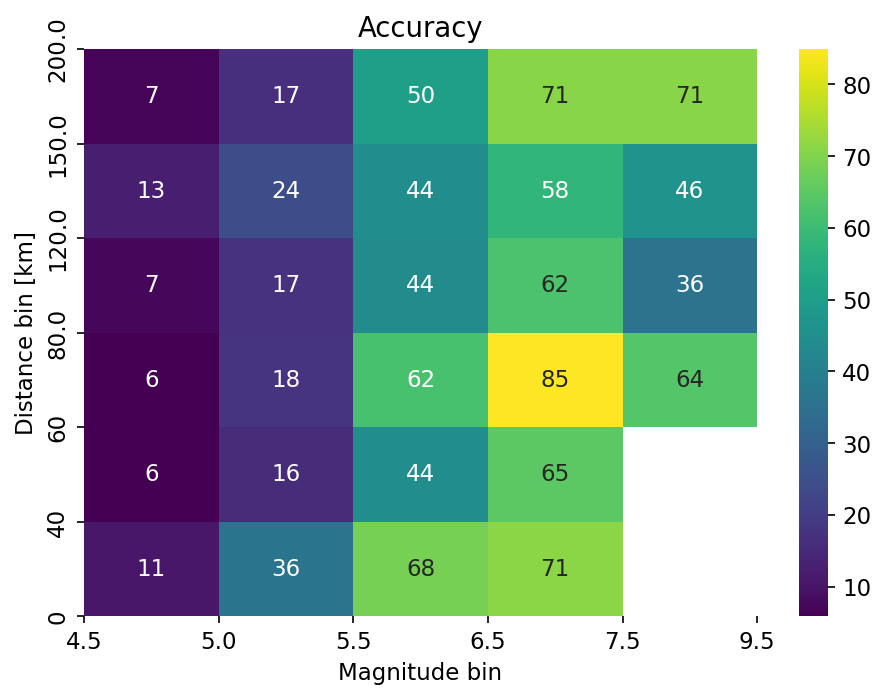

In [30]:
fig = BinPlot(metric=accuracy, mag_bins=magnitude_bins, dist_bins=distance_bins, fmt=".0f", title="Accuracy")(
    preds=classifier_preds,
    target=real_labels,  # missusing target for labels
    cond=generated_data['cond']
)
plt.show()

100%|██████████| 128/128 [00:37<00:00,  3.43it/s]


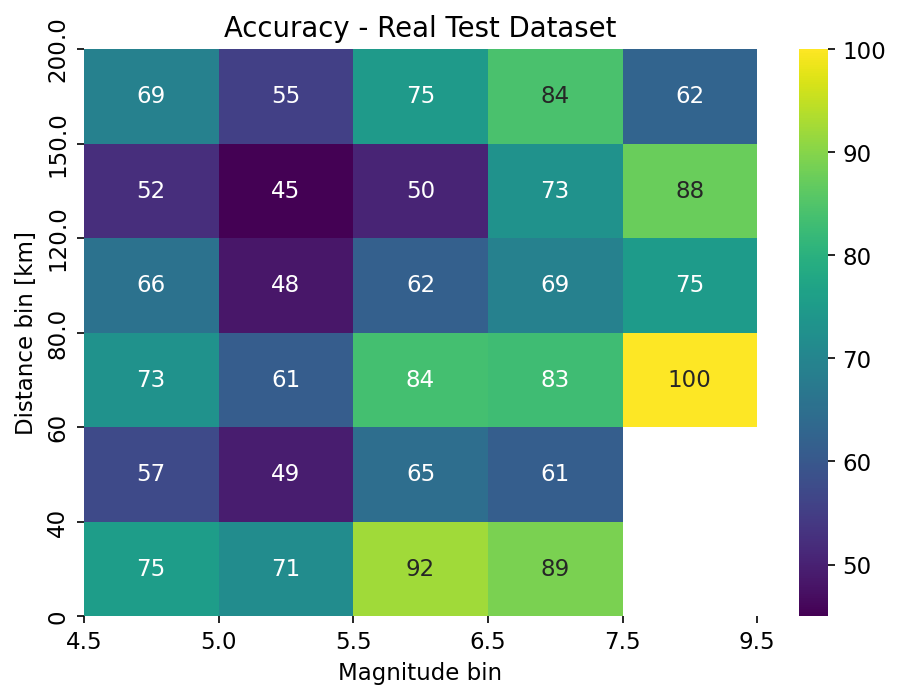

In [38]:
fig = BinPlot(metric=accuracy, mag_bins=magnitude_bins, dist_bins=distance_bins, fmt=".0f", title="Accuracy - Real Test Dataset")(
    preds=classifier.get_predictions(test_dataset[:]['waveform'], classifier_data_repr),
    target=real_labels[:len(test_dataset)],  # missusing target for labels
    cond=test_dataset[:]['cond']
)
plt.show()

#### Compute Embedding Score

In [32]:
from tqdne.metric import compute_inception_score

classifier_probs = classifier.get_probabilities(gen_embeddings, from_embeddings=True)
print("Inception Score - Synthetic Dataset (Full):", compute_inception_score(classifier_probs))
#print("Inception Score - Synthetic Dataset (Test):", compute_inception_score(classifier_probs[:train_start_idx]))
print("Inception Score - Real Dataset (Full):", compute_inception_score(classifier.get_probabilities(real_data['waveforms'], classifier_data_repr)))

100%|██████████| 128/128 [00:00<00:00, 2346.60it/s]


(197370, 20)
Inception Score - Synthetic Dataset (Full): 7.78961999687872
(19737, 20)
Inception Score - Synthetic Dataset (Test): 11.260576


100%|██████████| 128/128 [06:06<00:00,  2.86s/it]

(197370, 20)
Inception Score - Real Dataset (Full): 15.077494269261008
